In [13]:
from IPython.display import Image

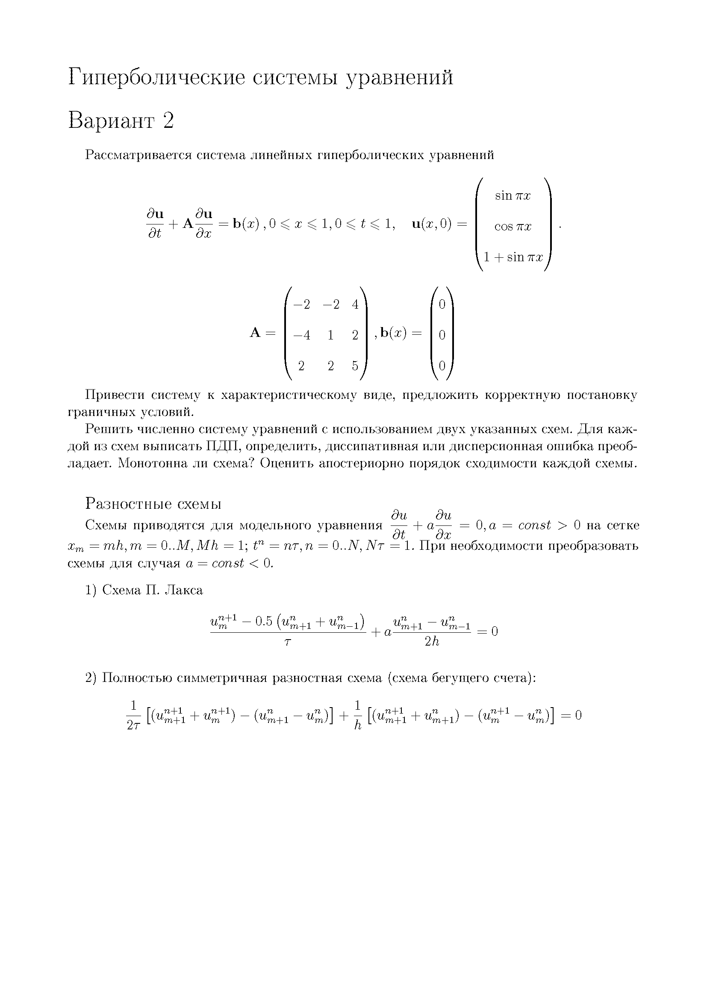

In [16]:
Image("hyper-2.png")

In [49]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.optimize import curve_fit
from sympy import nsimplify

A = np.array([
    [-2, -2, 4],
    [-4, 1, 2],
    [2, 2, 5]]
)

L, T = 1, 1

In [62]:
A.T

array([[-2, -4,  2],
       [-2,  1,  2],
       [ 4,  2,  5]])

Для левых собственных векторов верно, что

$$\omega^T A = \lambda \omega^T \Leftrightarrow A^T\omega = \lambda \omega$$

In [50]:
lambdas, left_w = np.linalg.eig(A.T)

In [51]:
left_w = left_w.T

In [61]:
left_w

array([[ 0.81649658,  0.40824829, -0.40824829],
       [ 0.53452248, -0.80178373, -0.26726124],
       [ 0.05842062,  0.35052374,  0.93472998]])

In [65]:
for lmbd, w in zip(lambdas, left_w):
    w = w / abs(w).min()
    print(f'Собственному значению {round(lmbd)} соответствует левый собственный вектор {np.vectorize(nsimplify)(w)}')

Собственному значению -5 соответствует левый собственный вектор [2 1 -1]
Собственному значению 3 соответствует левый собственный вектор [2 -3 -1]
Собственному значению 6 соответствует левый собственный вектор [1 6 16]


Получились собственные значения $\lambda \in \{-5, 3, 6\}$ с левыми собственными векторами

$$
\begin{array}{l}
\omega_{-5} = (2, 1, -1)\\
\omega_{3} = (2, -3, -1)\\
\omega_{6} = (1, 6, 16)
\end{array}
$$

In [66]:
Omega = np.array([
    [2, 1, -1],
    [2, -3, -1],
    [1, 6, 16]]
)
Lambda = np.array([
    [-5, 0, 0],
    [0, 3, 0],
    [0, 0, 6]]
)

In [84]:
Omega_inverse = np.vectorize(nsimplify)(np.linalg.inv(Omega))

In [85]:
Omega_inverse

array([[7/22, 1/6, 1/33],
       [1/4, -1/4, 0],
       [-5/44, 1/12, 2/33]], dtype=object)

In [86]:
print(np.linalg.det(Omega))

-131.99999999999997


In [87]:
Omega_inverse * np.linalg.det(Omega)

array([[-42.0000000000000, -22.0000000000000, -4.00000000000000],
       [-33.0000000000000, 33.0000000000000, 0],
       [15.0000000000000, -11.0000000000000, -8.00000000000000]],
      dtype=object)

Перейдем к инвариантам Римана $\mathbf{R}(x, t) = \mathbf{\Omega} \mathbf{u}(x, t), \mathbf{u} = (u_1, u_2, u_3)^T$, удовлетворяющих системе уравнений

$$\mathbf{R}_t + \mathbf{\Lambda} \mathbf{R}_x = \mathbf{0}$$

$$\mathbf{R} = (2u_1+u_2-u_3, 2u_1-3u_2-u_3, u_1+6u_2+16u_3)^T$$

Начальные условия при этом принимают вид

$$
\begin{array}{l|r}
\mathbf{R}(x, 0) = (2\sin{\pi x}+\cos{\pi x}-1-\sin{\pi x}, 2\sin{\pi x}-3\cos{\pi x}-1-\sin{\pi x}, \sin{\pi x}+6\cos{\pi x}+16+16\sin{\pi x})^T=\\
=(\sin{\pi x}+\cos{\pi x}-1, \sin{\pi x}-3\cos{\pi x}-1, 17\sin{\pi x}+6\cos{\pi x}+16)^T \equiv \mathbf{\varphi}(x)
\end{array}
$$

Для каждой компоненты $\mathbf{R}(x, t)$ требуется решить систему

$$
\begin{array}{l}
(R_i)_t + \lambda_i (R_i)_x = 0\\
R_i(x, 0) = \varphi_i(x)
\end{array}
$$

Введем замену координат $\eta=x+at, \xi=x-at$, $a\equiv \lambda_i$

$$
\begin{array}{l}
\frac{\partial R_i}{\partial t} =\frac{\partial R_i}{\partial \eta} \cdot a+\frac{\partial R_i}{\partial \xi} \cdot(-a) \\
\frac{\partial R_i}{\partial x}=\frac{\partial R_i}{\partial \eta}+\frac{\partial R_i}{\partial \xi} \\
a \frac{\partial R_i}{\partial \eta}-a \frac{\partial R_i}{\partial \xi}+a \frac{\partial R_i}{\partial \eta}+a \frac{\partial R_i}{\partial \xi}=0 \\
\frac{\partial R_i}{\partial \eta}=0 \Rightarrow R_i=f(\xi)=f(x-a t)\\
R_i(x, 0)=f(x)=\varphi_i(x) \Rightarrow f=\varphi_i \\
\Rightarrow R_i(x, t)=\varphi_i(x-a t)
\end{array}
$$

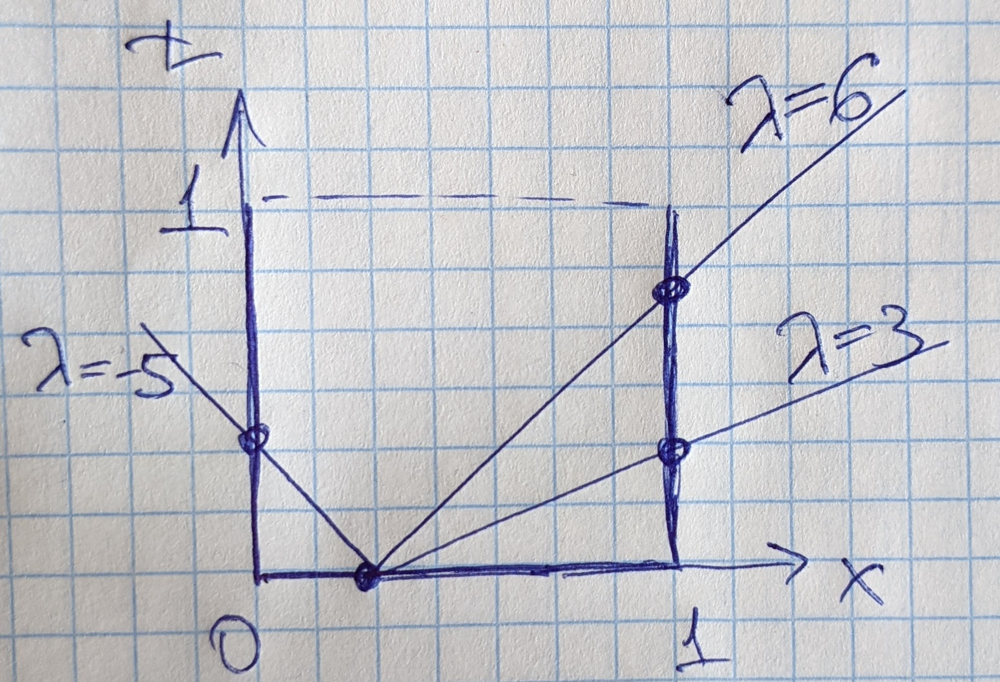

In [67]:
Image('gran_usl.jpg')

Поскольку вдоль характеристики уравнение имеет вид $\mathbf{R}_t = \mathbf{0}$, то вдоль нее значение при $x\in[0,1]$ переносится на все точки вдоль характеристики, в том числе на края $x=0$ и $x=1$.

$$
\begin{array}{l}
R_1(0, t) = \varphi_1(5t) = \sin{5\pi t}+\cos{5\pi t}-1\\
R_2(1, t) = \varphi_2(-3t) = -\sin(3\pi t)-3\cos{3\pi t}-1\\
R_3(1,t) = \varphi_2(-6t) = -17\sin(6\pi t)+6\cos{3\pi t}+16
\end{array}
$$

В итоге получается, что для решения системы требуется добавить 2 краевых условия на левой границе $x=0$ и 1 краевое условие на правой границе $x=1$.

Получились следующие 3 задачи:

$$
\begin{array}{lll}
(R_1)_t - 5(R_1)_x = 0& (R_2)_t + 3(R_2)_x = 0& (R_3)_t + 6(R_1)_x = 0\\
R_1(x, 0) = \sin{\pi x}+\cos{\pi x}-1&R_2(x, 0) = \sin{\pi x}-3\cos{\pi x}-1&R_3(x, 0) = 17\sin{\pi x}+6\cos{\pi x}+16\\
R_1(0, t) = \sin{5\pi t}+\cos{5\pi t}-1&R_2(0, t) = -\sin(3\pi t)-3\cos{3\pi t}-1&R_3(0, t) = -17\sin(6\pi t)+6\cos{3\pi t}+16\\
\end{array}
$$

Исходная задача имеет решение $\mathbf{u} = \mathbf{\Omega}^{-1}\mathbf{R}$

$$
\begin{array}{lll}
u_1 = \frac{42R_1+22R_2+4R_3}{132} &u_2 = \frac{33R_1-33R_2}{132}&u_1 = \frac{-15R_1+11R_2+8R_3}{132}
\end{array}
$$

# Схема решения П. Лакса

$$
\frac{u_{m}^{n+1}-0.5\left(u_{m+1}^{n}+u_{m-1}^{n}\right)}{\tau}+a \frac{u_{m+1}^{n}-u_{m-1}^{n}}{2 h}=0
$$

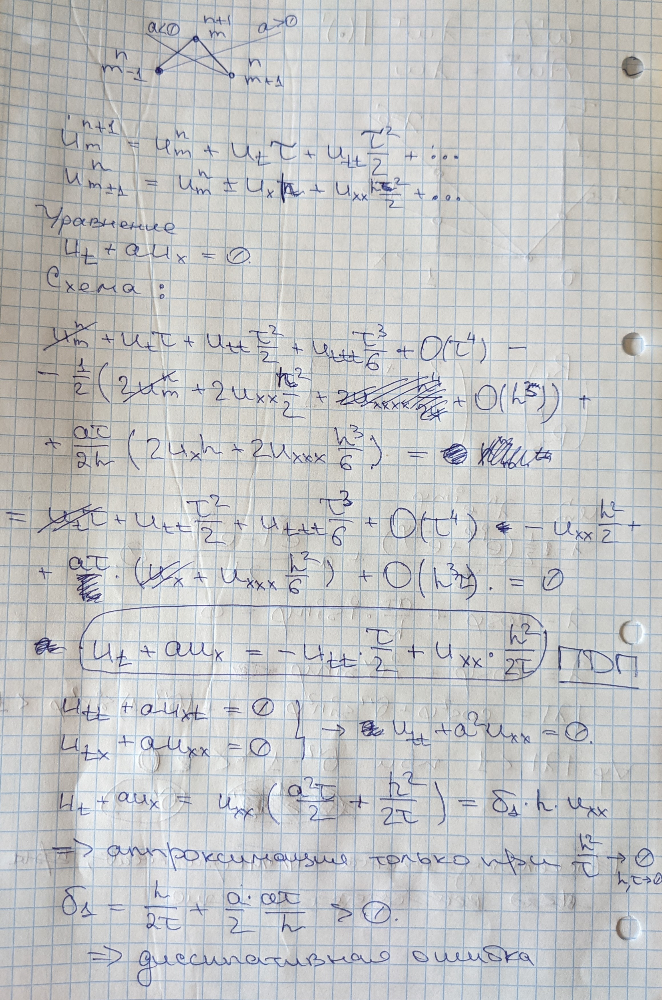

In [89]:
Image('lax1.jpg')

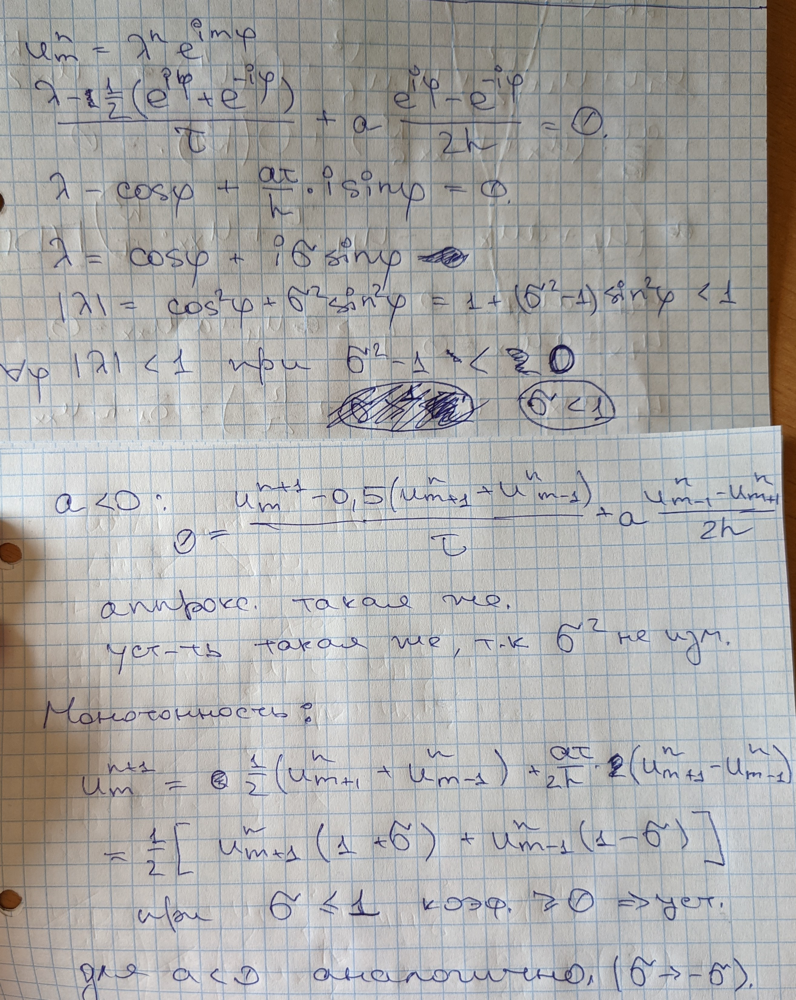

In [90]:
Image('lax2.jpg')

In [91]:
from matplotlib import gridspec
from matplotlib import axes

In [94]:
def plot_nev(x, t, u, s, a, R0):
    print("K =", abs(a*tau/h))
    x_, t_ = np.meshgrid(x, t)
    fig = plt.figure(figsize = (24, 6))
    gs2 = gridspec.GridSpec(3, 3)
    ax = fig.add_subplot(gs2[:, :1], projection='3d')
    ax.plot_wireframe(x_,t_, u)
    ax.set_xlabel("x")
    ax.set_ylabel("t")
    ax.set_zlabel(s)
    ax.set_title(s)
    ax.plot_surface(x_, t_, R_th(x_, t_, a, R0), color = "green", alpha = 0.5)
    ax1 = fig.add_subplot(gs2[:2, -2])
    ax1.plot(t, [max(abs(u[n]-R_th(x, n*tau, a, R0))) for n in range(len(t))])
    ax1.set_xlabel("t")
    ax1.set_ylabel("max$_x$|"+s+"-Rth|")
    ax1.set_title("Невязка по x")
    ax2= fig.add_subplot(gs2[:2, -1])
    ax2.plot(x, [max(abs(u[:, m]-R_th(h*m, t, a, R0))) for m in range(len(x))])
    ax2.set_xlabel("x")
    ax2.set_ylabel("max$_t$|"+s+"-Rth|")
    ax2.set_title("Невязка по t")
    plt.show()

In [100]:
#функция численного решения по схеме КИР
def Lax(a, R0, h, tau):
    sigma = a*tau/h
    M, N=int(L/h)+1, int(T/tau)+1
    R = np.zeros((N, M))
    R[0, :] = np.array([R0(x) for x in np.arange(0, L+h, h)]).copy()
    R[:, 0] = np.array([R0(-a*n*tau) for n in range(N)]).copy()
    for n in range(0, N-1):
        for m in range(1, M-1):
            R[n+1, m] = 0.5*(R[n, m+1]*(1+sigma) + R[n, m-1]*(1-sigma))
    return R

In [96]:
#начальные условия инвариантов Римана
R01 = lambda x: np.sin(np.pi*x)+np.cos(np.pi*x)-1
R02 = lambda x: np.sin(np.pi*x)-3*np.cos(np.pi*x)-1
R03 = lambda x: 17*np.sin(np.pi*x)+6*np.cos(np.pi*x)+16

In [102]:
def R_th(x, t, a, R0):
    return R0(x-a*t)

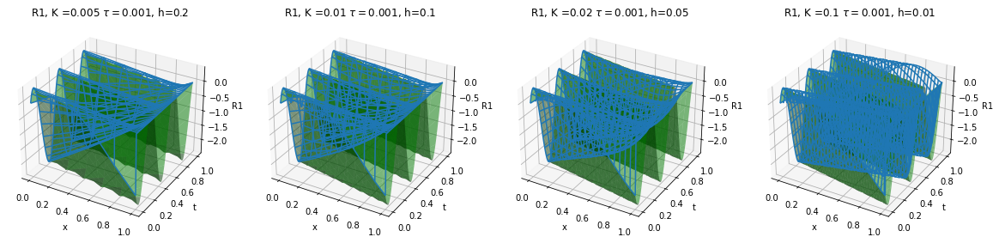

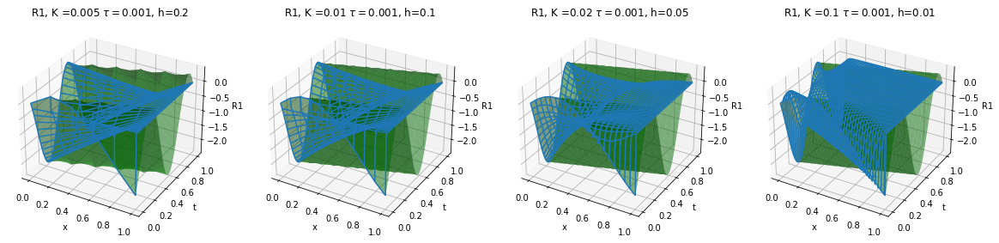

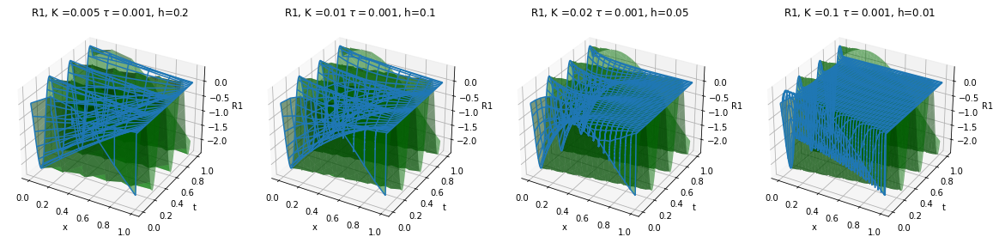

In [117]:
for lmbd in lambdas:
    fig = plt.figure(figsize = (20, 6))
#     plt.title(f'$\lambda$ = {lmbd}')
    tau = 0.001
    h = [0.2, 0.1, 0.05, 0.01]
    for i in range(4):
        ax = fig.add_subplot(1, 4, i+1, projection='3d')
        R1 = Lax(lmbd, R01, h[i], tau)
        x = np.arange(0, L+h[i], h[i])
        t = np.arange(0, T+tau, tau)
        x_, t_ = np.meshgrid(x, t)
        ax.plot_surface(x_, t_, R_th(x_, t_, lmbd, R01), color = "green", alpha = 0.5)
        ax.plot_wireframe(x_,t_, R1)
        ax.set_xlabel("x")
        ax.set_ylabel("t")
        ax.set_zlabel("R1")
        ax.set_title("R1, K ="+str(round(tau/h[i], 3))+" $\\tau=$"+str(tau)+", h="+str(h[i]))

K = 0.5000000000000006


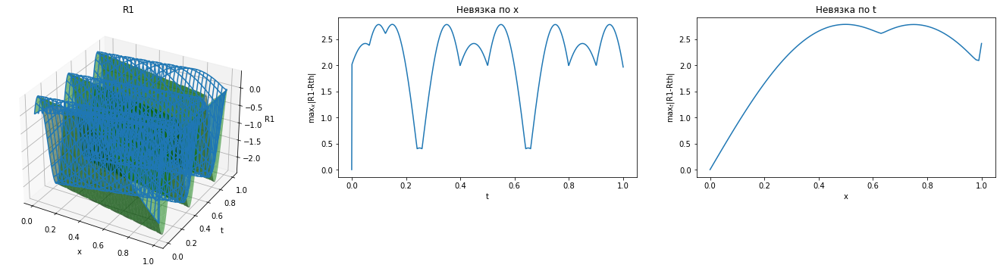

K = 0.29999999999999977


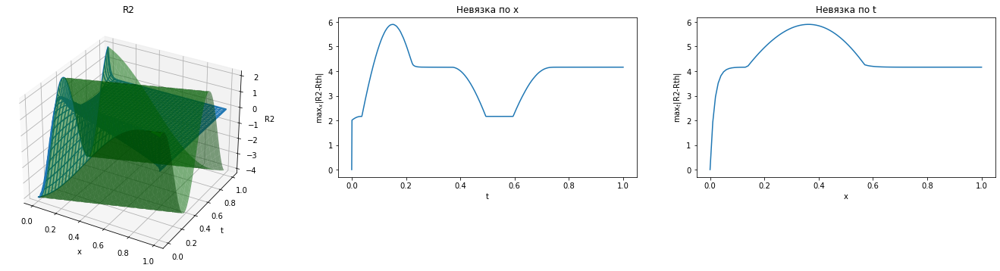

K = 0.5999999999999999


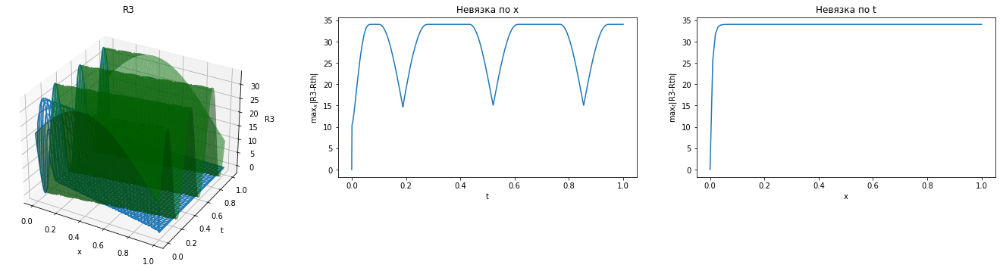

In [120]:
h, tau = 0.01, 0.001
x = np.arange(0, L+h, h)
t = np.arange(0, T+tau, tau)
for i, (lmbd, R0) in enumerate(zip(lambdas, [R01, R02, R03])):
    R_lax = Lax(lmbd, R0, h, tau)
    plot_nev(x, t, R_lax, f"R{i+1}", lmbd, R0)

# Схема бегущего счета

$$
\frac{1}{2 \tau}\left[\left(u_{m+1}^{n+1}+u_{m}^{n+1}\right)-\left(u_{m+1}^{n}-u_{m}^{n}\right)\right]+\frac{1}{h}\left[\left(u_{m+1}^{n+1}+u_{m+1}^{n}\right)-\left(u_{m}^{n+1}-u_{m}^{n}\right)\right]=0
$$

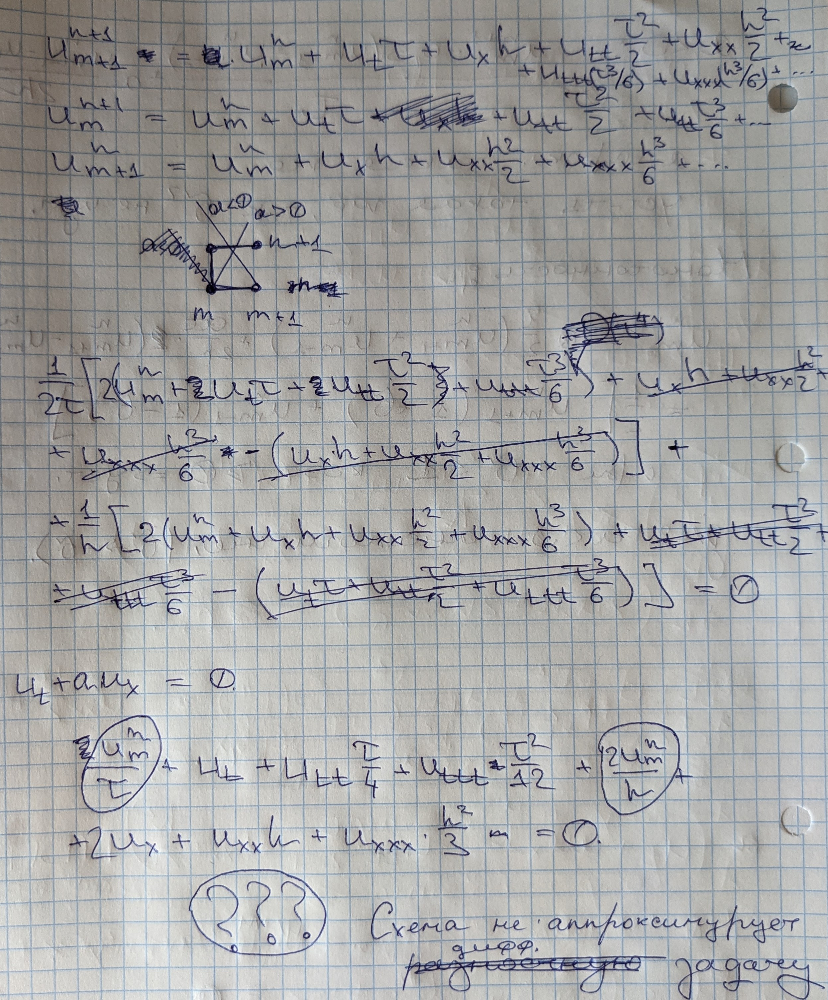

In [121]:
Image('runcount.jpg')